# Overview of the Lung cell atlas

In here I will highlight the different compartments of the Lung cell atlas, for visualisation purposes only, as the DEG analyses are done in each specific compartment. I will subset the dataset as in the compartment notebooks, therefore removing cell types reported as cycling, doublets or low quality.

In [1]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import scipy.sparse
import anndata
import seaborn as sns
#import scvelo as scv

#import milopy.core as milo
#import milopy.plot as milopl


In [2]:
sc.set_figure_params(dpi=100, dpi_save=300, transparent=False) # Makes it more visible

In [3]:
adata_vis = sc.read_h5ad('./Cell2location_outputs/sp.h5ad')
adata_vis

AnnData object with n_obs × n_vars = 20770 × 12912
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'Perichondrium', 'Weird_morphology', 'Cartilage', 'Glands', 'Tissue', 'Multilayer_epithelium', 'Nerve', 'Venous_vessel', 'Airway_Smooth_Muscle', 'Arterial_vessel', 'Parenchyma', 'Pulmonary_vessel', 'Mesothelium', 'Small_airway', 'iBALT', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'n_cells_by_counts-WSA_LngSP10193345', 'mean_counts-WSA_LngSP10193345', 'log1p_mean_counts-WSA_LngSP10193345', 'pct_dropout_by_counts-WSA_LngSP10193345', 'total_counts-WSA_LngSP10193345', 'log1p_total_counts-WSA_LngSP10193345', 'n_cells_by_counts-WSA_LngSP10193346', 'mean_counts-WSA_LngSP10193346', 'log1p_mean_counts-WSA_LngSP10193346', 

In [4]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,Airway_Smooth_Muscle,Arterial_vessel,Parenchyma,Pulmonary_vessel,Mesothelium,Small_airway,iBALT,_indices,_scvi_batch,_scvi_labels
spot_id,,,,,,,,,,,,,,,,,,,,,
WSA_LngSP8759311_AAACAAGTATCTCCCA-1,1,50,102,WSA_LngSP8759311,439,6.086775,606.0,6.408529,32.673267,44.059406,...,False,False,False,False,False,False,False,0,0,0
WSA_LngSP8759311_AAACAGAGCGACTCCT-1,1,14,94,WSA_LngSP8759311,267,5.590987,319.0,5.768321,31.974922,47.648903,...,False,False,False,False,False,False,False,1,0,0
WSA_LngSP8759311_AAACATTTCCCGGATT-1,1,61,97,WSA_LngSP8759311,406,6.008813,587.0,6.376727,34.752981,47.870528,...,False,False,False,False,False,False,False,2,0,0
WSA_LngSP8759311_AAACCCGAACGAAATC-1,1,45,115,WSA_LngSP8759311,138,4.934474,179.0,5.192957,50.837989,78.770950,...,False,False,False,False,False,False,False,3,0,0
WSA_LngSP8759311_AAACCGTTCGTCCAGG-1,1,52,42,WSA_LngSP8759311,448,6.107023,631.0,6.448889,31.378764,44.849445,...,False,False,False,False,False,False,False,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WSA_LngSP10193348_TTGTGTATGCCACCAA-1,1,56,60,WSA_LngSP10193348,395,5.981414,586.0,6.375025,35.153584,49.658703,...,False,False,False,False,False,False,False,20765,10,0
WSA_LngSP10193348_TTGTGTTTCCCGAAAG-1,1,51,59,WSA_LngSP10193348,1493,7.309212,2684.0,7.895436,22.056632,31.818182,...,False,False,False,False,False,False,False,20766,10,0
WSA_LngSP10193348_TTGTTAGCAAATTCGA-1,1,22,42,WSA_LngSP10193348,471,6.156979,1023.0,6.931472,50.146628,61.485826,...,False,False,False,False,False,False,False,20767,10,0


In [6]:
adata_vis.obs["sample"].value_counts()

WSA_LngSP10193345    3234
WSA_LngSP8759312     2564
WSA_LngSP10193346    2430
WSA_LngSP9258464     2323
WSA_LngSP9258468     2285
WSA_LngSP8759311     2251
WSA_LngSP8759313     2001
WSA_LngSP10193347    1937
WSA_LngSP10193348     937
WSA_LngSP9258467      422
WSA_LngSP9258463      386
Name: sample, dtype: int64

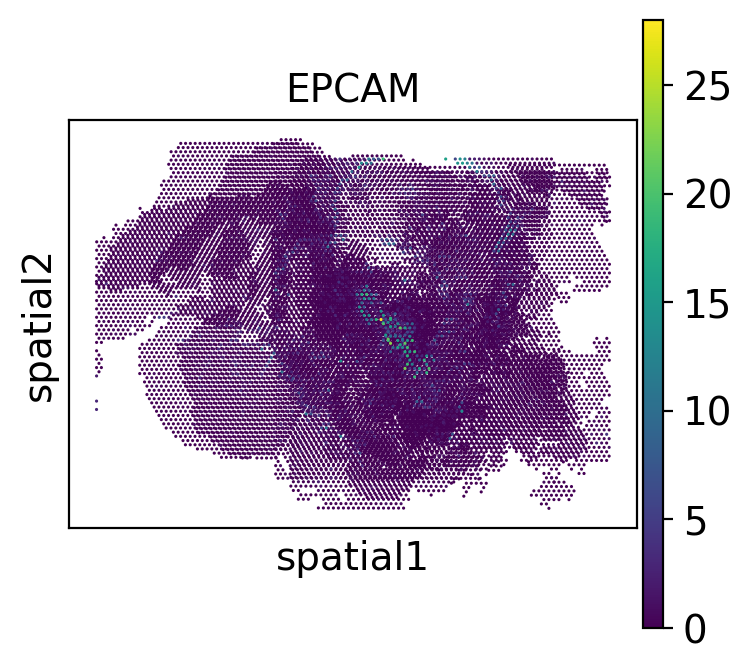

In [5]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

sc.pl.spatial(adata_vis, 
              color=["EPCAM"], img_key=None,
              vmin=0, library_id='WSA_LngSP9258467',
              gene_symbols='SYMBOL'
             )

/home/irepan/anaconda3/envs/pyscenic/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


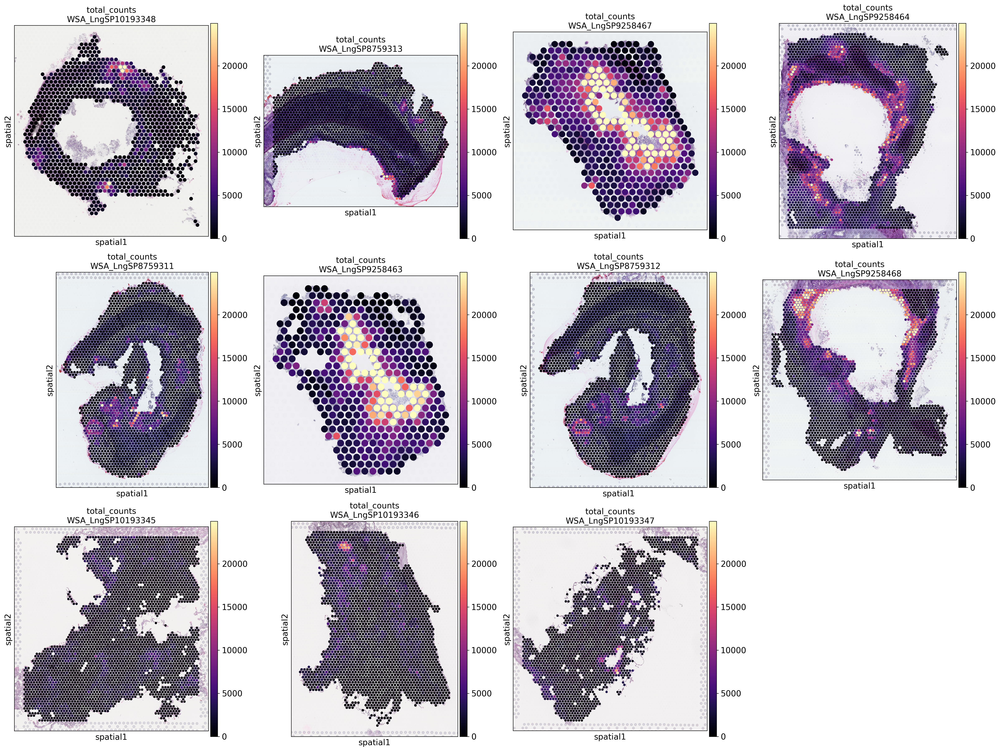

In [6]:
# defining useful function
def select_slide(adata, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

# identify spot locations to crop near tissue
def get_crop_coord(slide, scale='tissue_hires_scalef'):

    crop_max = (slide.obsm['spatial'] * list(slide.uns['spatial'].values())[0]['scalefactors'][scale]).max(axis=0)
    crop_min = (slide.obsm['spatial'] * list(slide.uns['spatial'].values())[0]['scalefactors'][scale]).min(axis=0)

    crop_x = [crop_min[0]-0, crop_max[0]+0]
    crop_y = [crop_min[1]-0, crop_max[1]+0]

    return crop_x, crop_y
    

def plot_spatial_per_cell_type(adata, 
                               cell_type='total_counts',
                               samples=[
       'WSA_LngSP10193348', 'WSA_LngSP8759311', 'WSA_LngSP10193345',
                                    
       'WSA_LngSP8759313', 'WSA_LngSP9258463', 'WSA_LngSP10193346',
                                   
       'WSA_LngSP9258467', 'WSA_LngSP8759312', 'WSA_LngSP10193347',
                                   
       'WSA_LngSP9258464', 'WSA_LngSP9258468',
                               ],
                              ncol=4, prefix='', figsize=(24, 18),
                              vmax_quantile=0.992):
    n_samples = len(samples)
    nrow = int(np.ceil(n_samples / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=figsize)
    if nrow == 1:
        axs = axs.reshape((1, ncol))
    
    col_name = f'{prefix}{cell_type}'
    vmax = np.quantile(adata_vis.obs[col_name].values, vmax_quantile)
    adata_vis.obs[cell_type] = adata_vis.obs[col_name].copy()
    
    from itertools import chain
    ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))
    
    for i, s in enumerate(samples):
        sp_data_s = select_slide(adata, s, s_col='sample')
        sc.pl.spatial(sp_data_s, cmap='magma',
                      color=cell_type, 
                      size=1.3, img_key='hires', alpha_img=1,
                      vmin=0, vmax=vmax, ax=axs[ind[i][0],ind[i][1]], show=False
                                            )
        axs[ind[i][0],ind[i][1]].title.set_text(cell_type+'\n'+s)
        
    if len(samples) < len(axs.flatten()):
        for i in range(len(samples), len(axs.flatten())):
            axs[ind[i][0],ind[i][1]].axis('off')
        
    fig.tight_layout(pad=0.5)
        
    return fig

plot_spatial_per_cell_type(adata_vis, cell_type='total_counts');

In [7]:
adata_vis.uns['mod']['factor_names']#.to_csv('./factor_names')

array(['AT1', 'AT2', 'B_memory', 'B_naive', 'B_plasma_IgA',
       'B_plasma_IgG', 'B_plasmablast', 'Basal', 'CD4_EM_Effector',
       'CD4_TRM', 'CD4_naive_CM', 'CD8_EM', 'CD8_EM_EMRA', 'CD8_TRM_EM',
       'CD8_TRM', 'Chondrocyte', 'Ciliated', 'DC_1', 'DC_2',
       'DC_activated', 'DC_plasmacytoid', 'Deuterosomal', 'Dividing_AT2',
       'Dividing_Basal', 'Endothelia_Lymphatic',
       'Endothelia_vascular_Cap_a', 'Endothelia_vascular_Cap_g',
       'Endothelia_vascular_arterial_pulmonary',
       'Endothelia_vascular_arterial_systemic',
       'Endothelia_vascular_venous_pulmonary',
       'Endothelia_vascular_venous_systemic', 'Erythrocyte',
       'Fibro_adventitial', 'Fibro_alveolar', 'Fibro_immune_recruiting',
       'Fibro_myofibroblast', 'Fibro_peribronchial',
       'Fibro_perichondrial', 'ILC', 'Ionocyte_n_Brush', 'MAIT',
       'Macro_CHIT1', 'Macro_interstitial', 'Macro_AW_CX3CR1',
       'Macro_alveolar_metallothioneins', 'Macro_alv', 'Macro_dividing',
       'Macro_int'

In [8]:
fig_dir = './Cell2location_outputs/plots/'

annot_ = ['Tissue', 'Perichondrium', 'Cartilage', 'Glands',
       'Multilayer_epithelium', 'Airway_Smooth_Muscle', 'Weird_morphology',
       'Nerve', 'Venous_vessel', 'Arterial_vessel', 'Parenchyma',
       'Mesothelium', 'Pulmonary_vessel', 'Small_airway', 'iBALT']

annot_abundance_df = pd.DataFrame(index=adata_vis.uns['mod']['factor_names'],
                                  columns=annot_)


In [9]:
annot_abundance_df

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT
AT1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AT2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_memory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_naive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_plasma_IgA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Secretory_Club,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Secretory_Goblet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Suprabasal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T_reg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,SMG_Duct,SMG_Mucous,SMG_Serous,Schwann_Myelinating,Schwann_nonmyelinating,Secretory_Club,Secretory_Goblet,Suprabasal,T_reg,gdT
spot_id,,,,,,,,,,,,,,,,,,,,,
WSA_LngSP8759311_AAACAAGTATCTCCCA-1,1,50,102,WSA_LngSP8759311,439,6.086775,606.0,6.408529,32.673267,44.059406,...,0.522866,0.090418,0.359614,0.018557,0.025916,0.006484,0.114056,0.098311,0.018358,0.021427
WSA_LngSP8759311_AAACAGAGCGACTCCT-1,1,14,94,WSA_LngSP8759311,267,5.590987,319.0,5.768321,31.974922,47.648903,...,0.177749,0.008573,0.140119,0.007637,0.006440,0.001444,0.051752,0.012424,0.006325,0.006151
WSA_LngSP8759311_AAACATTTCCCGGATT-1,1,61,97,WSA_LngSP8759311,406,6.008813,587.0,6.376727,34.752981,47.870528,...,0.707832,0.084883,0.947579,0.029725,0.039414,0.003176,0.119832,0.067215,0.015664,0.020316
WSA_LngSP8759311_AAACCCGAACGAAATC-1,1,45,115,WSA_LngSP8759311,138,4.934474,179.0,5.192957,50.837989,78.770950,...,0.141221,0.002836,0.041023,0.001993,0.007235,0.005059,0.008873,0.004899,0.008765,0.007271
WSA_LngSP8759311_AAACCGTTCGTCCAGG-1,1,52,42,WSA_LngSP8759311,448,6.107023,631.0,6.448889,31.378764,44.849445,...,0.558597,0.076829,0.583874,0.037040,0.097127,0.003615,0.019085,0.009039,0.020335,0.031450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WSA_LngSP10193348_TTGTGTATGCCACCAA-1,1,56,60,WSA_LngSP10193348,395,5.981414,586.0,6.375025,35.153584,49.658703,...,0.317106,0.011666,0.471794,0.008469,0.048493,0.001075,0.000866,0.001659,0.017517,0.029186
WSA_LngSP10193348_TTGTGTTTCCCGAAAG-1,1,51,59,WSA_LngSP10193348,1493,7.309212,2684.0,7.895436,22.056632,31.818182,...,0.045650,0.000375,0.005570,0.065236,0.408460,0.006113,0.000678,0.006557,0.069900,0.096725
WSA_LngSP10193348_TTGTTAGCAAATTCGA-1,1,22,42,WSA_LngSP10193348,471,6.156979,1023.0,6.931472,50.146628,61.485826,...,3.814279,0.147798,0.746851,0.039551,0.013911,0.003872,0.006695,0.002554,0.015576,0.028772


In [11]:
## These are the indexes of the spots identified as "Multilayer epithelium"
## these are rows in the dataframe
ind = adata_vis.obs["Multilayer_epithelium"] == True
ind

spot_id
WSA_LngSP8759311_AAACAAGTATCTCCCA-1     False
WSA_LngSP8759311_AAACAGAGCGACTCCT-1     False
WSA_LngSP8759311_AAACATTTCCCGGATT-1     False
WSA_LngSP8759311_AAACCCGAACGAAATC-1     False
WSA_LngSP8759311_AAACCGTTCGTCCAGG-1     False
                                        ...  
WSA_LngSP10193348_TTGTGTATGCCACCAA-1    False
WSA_LngSP10193348_TTGTGTTTCCCGAAAG-1    False
WSA_LngSP10193348_TTGTTAGCAAATTCGA-1    False
WSA_LngSP10193348_TTGTTGTGTGTCAAGA-1    False
WSA_LngSP10193348_TTGTTTCACATCCAGG-1    False
Name: Multilayer_epithelium, Length: 20770, dtype: bool

In [12]:
## these are the names of the tissues
adata_vis.uns['mod']['factor_names']

array(['AT1', 'AT2', 'B_memory', 'B_naive', 'B_plasma_IgA',
       'B_plasma_IgG', 'B_plasmablast', 'Basal', 'CD4_EM_Effector',
       'CD4_TRM', 'CD4_naive_CM', 'CD8_EM', 'CD8_EM_EMRA', 'CD8_TRM_EM',
       'CD8_TRM', 'Chondrocyte', 'Ciliated', 'DC_1', 'DC_2',
       'DC_activated', 'DC_plasmacytoid', 'Deuterosomal', 'Dividing_AT2',
       'Dividing_Basal', 'Endothelia_Lymphatic',
       'Endothelia_vascular_Cap_a', 'Endothelia_vascular_Cap_g',
       'Endothelia_vascular_arterial_pulmonary',
       'Endothelia_vascular_arterial_systemic',
       'Endothelia_vascular_venous_pulmonary',
       'Endothelia_vascular_venous_systemic', 'Erythrocyte',
       'Fibro_adventitial', 'Fibro_alveolar', 'Fibro_immune_recruiting',
       'Fibro_myofibroblast', 'Fibro_peribronchial',
       'Fibro_perichondrial', 'ILC', 'Ionocyte_n_Brush', 'MAIT',
       'Macro_CHIT1', 'Macro_interstitial', 'Macro_AW_CX3CR1',
       'Macro_alveolar_metallothioneins', 'Macro_alv', 'Macro_dividing',
       'Macro_int'

In [13]:
## here we subset the metadata with the cells for epithelium as rows and celltypes as columns
adata_vis.obs.loc[ind, adata_vis.uns['mod']['factor_names']]

,AT1,AT2,B_memory,B_naive,B_plasma_IgA,B_plasma_IgG,B_plasmablast,Basal,CD4_EM_Effector,CD4_TRM,...,SMG_Duct,SMG_Mucous,SMG_Serous,Schwann_Myelinating,Schwann_nonmyelinating,Secretory_Club,Secretory_Goblet,Suprabasal,T_reg,gdT
spot_id,,,,,,,,,,,,,,,,,,,,,
WSA_LngSP8759311_AAACGAGACGGTTGAT-1,0.045306,0.014257,0.044896,0.078163,0.265785,0.013782,0.031585,1.829979,0.071248,0.083167,...,0.346495,2.043128,0.635213,0.119989,0.071888,0.028857,4.420967,3.284353,0.073253,0.049941
WSA_LngSP8759311_AAACTGCTGGCTCCAA-1,0.299219,0.145293,0.026319,0.054725,0.045666,0.001957,0.006515,9.997827,0.049982,0.045799,...,0.019822,1.072495,0.096850,0.017286,0.012651,0.025658,1.668608,6.303173,0.042375,0.033761
WSA_LngSP8759311_AACGCGGTCTCCAGCC-1,0.020895,0.006934,0.102913,0.186152,0.664853,0.040189,0.075920,2.042164,0.185644,0.210811,...,1.511986,1.187330,1.659006,0.597180,0.238988,0.087246,2.981958,1.538868,0.180703,0.139154
WSA_LngSP8759311_AAGCTAGATCGAGTAA-1,0.050082,0.017079,0.216826,0.681665,0.129515,0.011798,0.088047,6.151400,0.491852,0.509829,...,0.101928,3.221879,0.520499,0.047930,0.033391,0.195795,9.536402,5.128440,0.475194,0.282770
WSA_LngSP8759311_AATAGAATCTGTTTCA-1,0.398006,0.426106,0.117639,0.161599,0.161726,0.032190,0.058117,2.615890,0.179050,0.152367,...,0.655522,0.351955,0.371749,0.090549,0.134593,0.319843,3.210099,1.683192,0.153966,0.141251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WSA_LngSP10193348_TGGTCTGTTGGGCGTA-1,0.004263,0.003187,0.013781,0.015539,0.063813,0.005646,0.043043,0.111810,0.019356,0.015295,...,0.322467,0.075625,0.269211,0.006228,0.006424,0.002344,0.082144,0.078320,0.014830,0.014539
WSA_LngSP10193348_TGTTCTTCCATTGACT-1,0.004736,0.002272,0.009355,0.010078,0.067212,0.006984,0.006272,0.005234,0.013618,0.011842,...,0.185579,0.021281,0.140081,0.006158,0.045431,0.001875,0.001379,0.003237,0.010420,0.014435
WSA_LngSP10193348_TTAACTTCAGGTAGGA-1,0.058887,0.054056,0.021488,0.020976,0.017899,0.000786,0.003099,0.012525,0.034372,0.033055,...,0.068217,0.001264,0.058354,0.022356,0.162826,0.004082,0.000455,0.003795,0.026718,0.037997


In [14]:
## here we take the mean of the rows (index 0)
adata_vis.obs.loc[ind, adata_vis.uns['mod']['factor_names']].mean(0)

AT1                 0.030967
AT2                 0.022995
B_memory            0.068453
B_naive             0.130786
B_plasma_IgA        0.102363
                      ...   
Secretory_Club      0.046216
Secretory_Goblet    3.456081
Suprabasal          1.966956
T_reg               0.107169
gdT                 0.072578
Length: 80, dtype: float64

In [15]:
# for each location (tissue)
for a in annot_:
    ind = adata_vis.obs[a] == True # find the spots index (row)
    annot_abundance_df[a] = adata_vis.obs.loc[ind, adata_vis.uns['mod']['factor_names']].mean(0) # mean of abundance



In [16]:
annot_abundance_df

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT
AT1,1.219467,0.017829,0.014186,0.028058,0.030967,0.037126,0.076148,0.133962,0.007466,0.087783,3.427678,0.882195,1.947193,1.022916,0.002741
AT2,1.520764,0.016366,0.012926,0.027167,0.022995,0.022508,0.081080,0.094599,0.005015,0.048608,4.261255,1.541261,2.540969,1.161928,0.003543
B_memory,0.108130,0.040272,0.020933,0.080904,0.068453,0.056248,0.037954,0.084308,0.148188,0.094807,0.217306,0.109897,0.142551,0.142432,0.590219
B_naive,0.097079,0.038052,0.024216,0.097709,0.130786,0.064174,0.034917,0.059014,0.066309,0.084204,0.179594,0.071221,0.114881,0.260537,0.253206
B_plasma_IgA,0.233748,0.410450,0.215632,1.941952,0.102363,0.148361,0.101060,0.045513,0.010739,0.021792,0.016531,0.019264,0.018640,0.087981,0.211261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Secretory_Club,0.018175,0.010413,0.008560,0.034549,0.046216,0.030377,0.010314,0.012783,0.014960,0.030265,0.013336,0.004808,0.008496,0.493215,0.006056
Secretory_Goblet,0.391395,0.312978,0.219142,0.561909,3.456081,0.655374,0.172140,0.054435,0.012832,0.087128,0.026865,0.003664,0.008199,4.184628,0.085279
Suprabasal,0.215193,0.145245,0.106595,0.244285,1.966956,0.370489,0.098257,0.044656,0.021065,0.077863,0.010648,0.002969,0.005364,1.591566,0.149437
T_reg,0.100695,0.031042,0.020210,0.087156,0.107169,0.075479,0.033590,0.056550,0.056034,0.117075,0.200976,0.070236,0.126618,0.216595,0.195469


In [17]:
## here we normalise the signal per cell type 
annot_abundance_norm = (annot_abundance_df.T / annot_abundance_df.sum(1)).T
annot_abundance_norm

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT
AT1,0.136471,0.001995,0.001588,0.003140,0.003465,0.004155,0.008522,0.014992,0.000836,0.009824,0.383593,0.098727,0.217911,0.114475,0.000307
AT2,0.133859,0.001441,0.001138,0.002391,0.002024,0.001981,0.007137,0.008327,0.000441,0.004278,0.375078,0.135663,0.223658,0.102274,0.000312
B_memory,0.055662,0.020731,0.010776,0.041647,0.035238,0.028955,0.019538,0.043399,0.076283,0.048804,0.111863,0.056572,0.073382,0.073320,0.303829
B_naive,0.061602,0.024146,0.015366,0.062002,0.082991,0.040722,0.022157,0.037448,0.042077,0.053433,0.113963,0.045194,0.072899,0.165326,0.160674
B_plasma_IgA,0.065197,0.114482,0.060144,0.541645,0.028551,0.041380,0.028187,0.012694,0.002995,0.006078,0.004611,0.005373,0.005199,0.024539,0.058924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Secretory_Club,0.024477,0.014023,0.011528,0.046529,0.062242,0.040911,0.013890,0.017216,0.020147,0.040759,0.017960,0.006475,0.011443,0.664244,0.008155
Secretory_Goblet,0.038252,0.030588,0.021417,0.054917,0.337770,0.064051,0.016824,0.005320,0.001254,0.008515,0.002626,0.000358,0.000801,0.408973,0.008334
Suprabasal,0.042608,0.028758,0.021105,0.048368,0.389451,0.073356,0.019455,0.008842,0.004171,0.015417,0.002108,0.000588,0.001062,0.315125,0.029588
T_reg,0.067359,0.020766,0.013519,0.058303,0.071690,0.050491,0.022470,0.037829,0.037484,0.078317,0.134442,0.046984,0.084700,0.144890,0.130758


In [27]:
annot_abundance_df.T

,AT1,AT2,B_memory,B_naive,B_plasma_IgA,B_plasma_IgG,B_plasmablast,Basal,CD4_EM_Effector,CD4_TRM,...,SMG_Duct,SMG_Mucous,SMG_Serous,Schwann_Myelinating,Schwann_nonmyelinating,Secretory_Club,Secretory_Goblet,Suprabasal,T_reg,gdT
Tissue,1.219467,1.520764,0.108130,0.097079,0.233748,0.074004,0.162067,0.211529,0.110587,0.097691,...,0.693403,0.233896,0.456029,0.040815,0.085916,0.018175,0.391395,0.215193,0.100695,0.100644
Perichondrium,0.017829,0.016366,0.040272,0.038052,0.410450,0.105705,0.193189,0.141685,0.038677,0.041343,...,1.135957,0.278291,0.629182,0.038962,0.053907,0.010413,0.312978,0.145245,0.031042,0.037027
Cartilage,0.014186,0.012926,0.020933,0.024216,0.215632,0.040197,0.062229,0.108176,0.024456,0.025102,...,0.687123,0.161472,0.495713,0.024183,0.033503,0.008560,0.219142,0.106595,0.020210,0.022388
Glands,0.028058,0.027167,0.080904,0.097709,1.941952,0.230048,0.708286,0.252980,0.111901,0.124302,...,4.961202,1.744164,3.725086,0.272314,0.198366,0.034549,0.561909,0.244285,0.087156,0.121332
Multilayer_epithelium,0.030967,0.022995,0.068453,0.130786,0.102363,0.037457,0.104351,1.938973,0.111803,0.120392,...,0.473953,0.850219,0.254496,0.034712,0.068774,0.046216,3.456081,1.966956,0.107169,0.072578
Airway_Smooth_Muscle,0.037126,0.022508,0.056248,0.064174,0.148361,0.047200,0.101992,0.328577,0.094329,0.091671,...,0.674861,0.162495,0.351852,0.094032,0.374889,0.030377,0.655374,0.370489,0.075479,0.084294
Weird_morphology,0.076148,0.081080,0.037954,0.034917,0.101060,0.034475,0.069957,0.096209,0.040870,0.039203,...,0.387634,0.077605,0.229208,0.028001,0.088788,0.010314,0.172140,0.098257,0.033590,0.036587
Nerve,0.133962,0.094599,0.084308,0.059014,0.045513,0.036297,0.207566,0.053558,0.071669,0.067735,...,0.239878,0.028406,0.122659,0.675210,3.673923,0.012783,0.054435,0.044656,0.056550,0.066118
Venous_vessel,0.007466,0.005015,0.148188,0.066309,0.010739,0.031484,0.365317,0.014628,0.077459,0.080855,...,0.114621,0.001619,0.061531,0.012203,0.118261,0.014960,0.012832,0.021065,0.056034,0.076484
Arterial_vessel,0.087783,0.048608,0.094807,0.084204,0.021792,0.070587,0.134864,0.089644,0.155836,0.144340,...,0.297874,0.019780,0.113957,0.276888,1.178812,0.030265,0.087128,0.077863,0.117075,0.141892


In [25]:
annot_abundance_df.sum(1)

AT1                  8.935714
AT2                 11.360983
B_memory             1.942603
B_naive              1.575899
B_plasma_IgA         3.585286
                      ...    
Secretory_Club       0.742520
Secretory_Goblet    10.232049
Suprabasal           5.050589
T_reg                1.494894
gdT                  1.570764
Length: 80, dtype: float64

In [ ]:
np.sum(annot_abundance_norm.iloc[0,:])

In [28]:
## here we normalise the signal per TISSUE
annot_abundance_norm_TISSUE = (annot_abundance_df / annot_abundance_df.sum(0))
annot_abundance_norm_TISSUE

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT
AT1,0.065280,0.001579,0.002152,0.000880,0.001060,0.001365,0.008231,0.006649,0.000335,0.001765,0.135811,0.073409,0.114902,0.023063,0.000052
AT2,0.081410,0.001450,0.001960,0.000852,0.000787,0.000827,0.008764,0.004695,0.000225,0.000977,0.168839,0.128250,0.149941,0.026198,0.000068
B_memory,0.005788,0.003568,0.003175,0.002537,0.002344,0.002068,0.004102,0.004184,0.006655,0.001906,0.008610,0.009145,0.008412,0.003211,0.011300
B_naive,0.005197,0.003371,0.003673,0.003064,0.004478,0.002359,0.003774,0.002929,0.002978,0.001693,0.007116,0.005926,0.006779,0.005874,0.004848
B_plasma_IgA,0.012513,0.036362,0.032705,0.060897,0.003505,0.005454,0.010923,0.002259,0.000482,0.000438,0.000655,0.001603,0.001100,0.001984,0.004045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Secretory_Club,0.000973,0.000922,0.001298,0.001083,0.001582,0.001117,0.001115,0.000634,0.000672,0.000609,0.000528,0.000400,0.000501,0.011120,0.000116
Secretory_Goblet,0.020952,0.027727,0.033238,0.017621,0.118330,0.024094,0.018606,0.002702,0.000576,0.001752,0.001064,0.000305,0.000484,0.094350,0.001633
Suprabasal,0.011520,0.012867,0.016167,0.007660,0.067345,0.013620,0.010620,0.002216,0.000946,0.001566,0.000422,0.000247,0.000317,0.035885,0.002861
T_reg,0.005390,0.002750,0.003065,0.002733,0.003669,0.002775,0.003631,0.002807,0.002516,0.002354,0.007963,0.005844,0.007472,0.004884,0.003742


In [31]:
annot_abundance_norm_TISSUE.to_csv("Lung_abundance_norm_TISSUE.csv")

In [59]:
annot_abundance_norm.to_csv("Lung_abundance_norm_CELLTYPE.csv")

<AxesSubplot:>

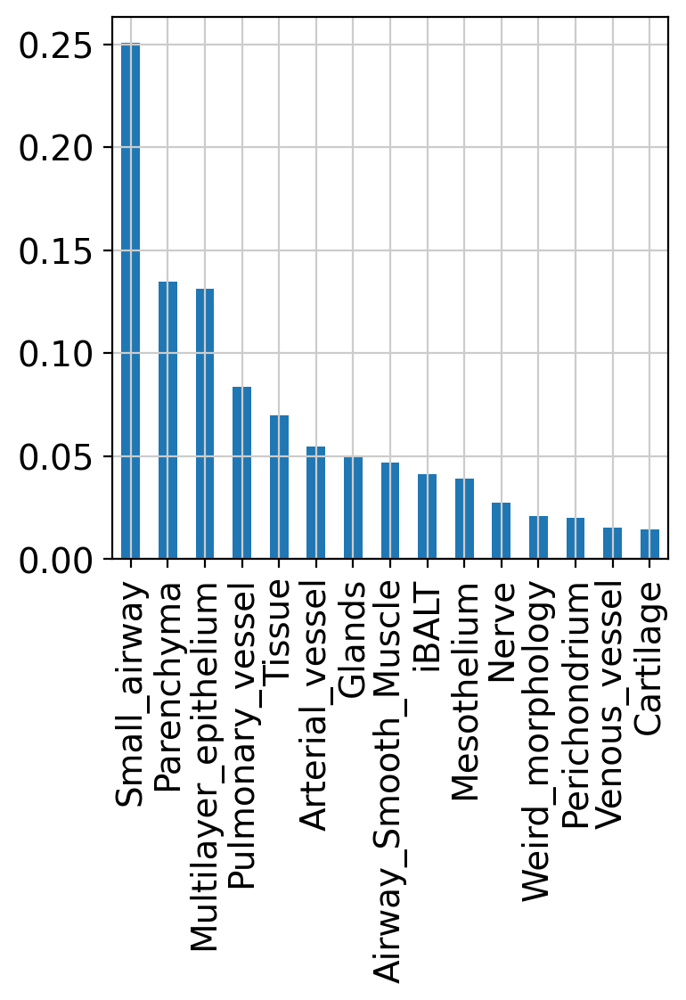

In [33]:
annot_abundance_norm.loc["CD8_TRM",].sort_values(ascending = False).plot(kind='bar')

<BarContainer object of 15 artists>

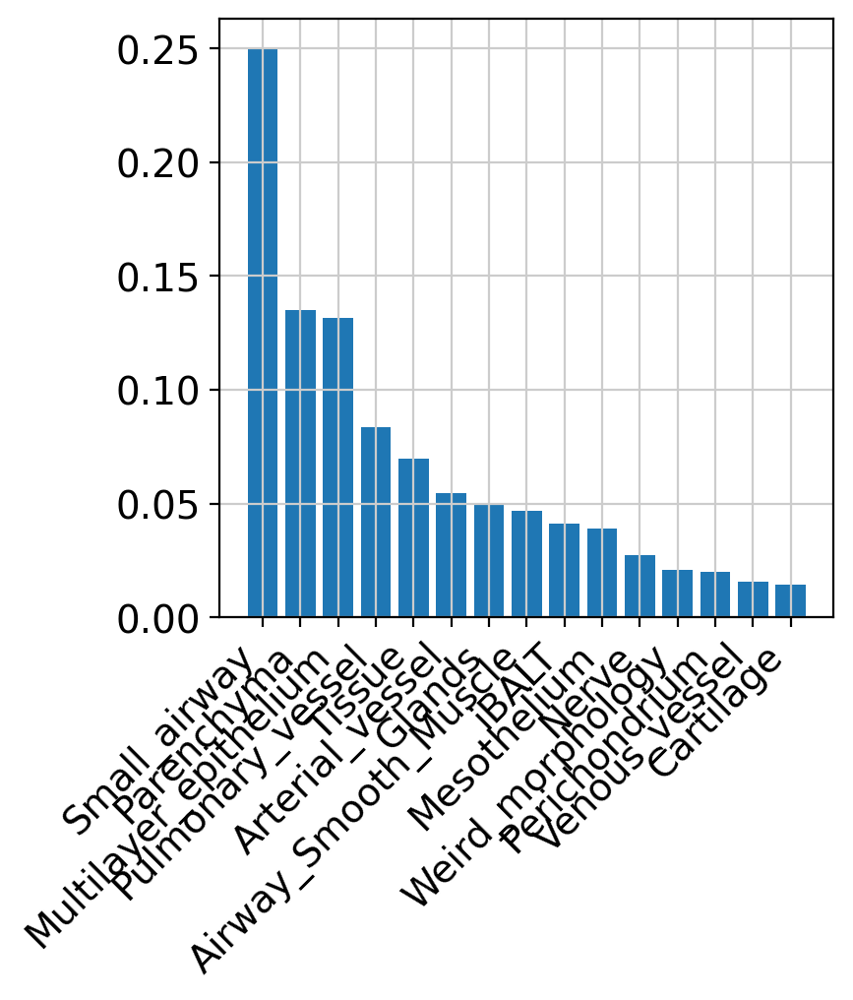

In [34]:
a = annot_abundance_norm.loc["CD8_TRM",].sort_values(ascending = False)

fig, ax = plt.subplots()
for label in ax.get_xticklabels():
  label.set_rotation(45)
  label.set_ha('right')
ax.bar(a.index, a.values)


In [35]:
signif_CT = ["CD8_TRM","T_reg",  'NK_CD16hi', 'NK_CD11d', 'NK_CD56bright']

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


CD8_TRM
T_reg
NK_CD16hi
NK_CD11d
NK_CD56bright


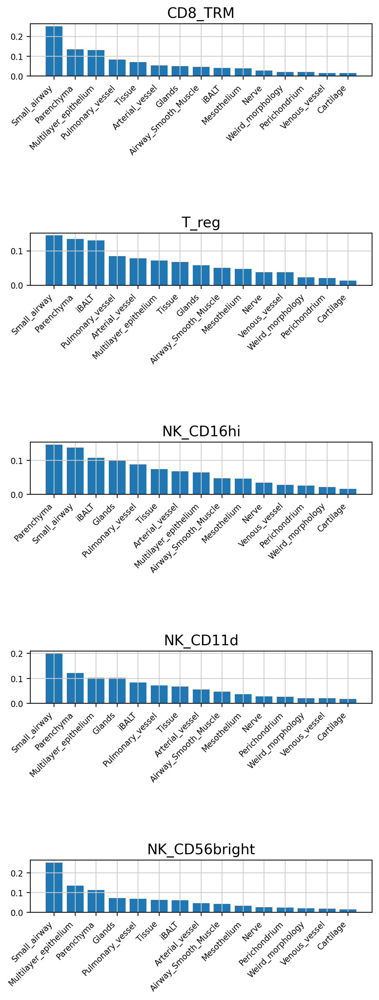

In [36]:
plt.rcParams["figure.figsize"] = (6,16)
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 12}

plt.rc('font', **font)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)
fig = plt.figure()
gs = fig.add_gridspec(5, hspace=3)
axs = gs.subplots()

#for label in ax.get_xticklabels():
#  label.set_rotation(45)
#  label.set_ha('right')
cont = 0

for i in signif_CT :
    print(i)
    for label in axs[cont].get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')
    
    a = annot_abundance_norm.loc[i,].sort_values(ascending = False)
    axs[cont].bar(a.index, a.values,)
    axs[cont].set_title(i)
    cont = cont + 1


In [37]:
annot_abundance_norm["Alpha"] = "NS"

## Analise T cells

In [38]:
Tcells_abundance = annot_abundance_norm

In [39]:
NOTsignif_CT = ['CD8_EM_EMRA', 'CD8_EM','NK_CD11d','CD4_naive_CM']
signif_CT = ["CD8_TRM","T_reg",  'NK_CD16hi', 'NK_CD11d', 'NK_CD56bright']

Tcells_abundance = Tcells_abundance.loc[[ 'CD4_naive_CM','CD8_EM',
                                         'CD8_EM_EMRA', 'CD8_TRM', "T_reg",
                                         'NK_CD16hi', 'NK_CD11d','NK_CD56bright']]

In [40]:
Tcells_abundance

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT,Alpha
CD4_naive_CM,0.033516,0.019009,0.006326,0.028234,0.014698,0.022945,0.016115,0.049863,0.158709,0.047189,0.055818,0.048958,0.037332,0.019483,0.441805,NS
CD8_EM,0.064057,0.022195,0.013999,0.064294,0.070736,0.048723,0.022403,0.037757,0.042345,0.076359,0.123321,0.045839,0.077925,0.141577,0.148469,NS
CD8_EM_EMRA,0.076195,0.016591,0.008883,0.048830,0.021064,0.027490,0.017140,0.034374,0.052634,0.049043,0.178646,0.064943,0.109967,0.065532,0.228668,NS
CD8_TRM,0.069633,0.019904,0.014421,0.049924,0.131460,0.046870,0.021000,0.027403,0.015521,0.054556,0.134886,0.039123,0.083680,0.250486,0.041132,NS
T_reg,0.067359,0.020766,0.013519,0.058303,0.071690,0.050491,0.022470,0.037829,0.037484,0.078317,0.134442,0.046984,0.084700,0.144890,0.130758,NS
NK_CD16hi,0.073561,0.025025,0.015719,0.098432,0.064022,0.047398,0.021225,0.034253,0.027810,0.067787,0.146267,0.045675,0.088055,0.137728,0.107044,NS
NK_CD11d,0.067556,0.026667,0.017326,0.102062,0.102421,0.046625,0.020885,0.028310,0.020519,0.054983,0.121016,0.036948,0.072495,0.199412,0.082776,NS
NK_CD56bright,0.064370,0.023693,0.016064,0.072832,0.136037,0.043676,0.020448,0.027184,0.018381,0.047189,0.113530,0.034049,0.068720,0.252353,0.061474,NS


In [41]:
Tcells_abundance.loc[signif_CT, "Alpha"] = "Signif"
Tcells_abundance.loc[NOTsignif_CT, "Alpha"] = "NS"
Tcells_abundance["Celltype"] = Tcells_abundance.index

In [42]:
dd=pd.melt(Tcells_abundance,id_vars=['Celltype', "Alpha"],
           var_name="location")
order = dd.groupby('location')['value'].mean().sort_values().index
dd

,Celltype,Alpha,location,value
0,CD4_naive_CM,NS,Tissue,0.033516
1,CD8_EM,NS,Tissue,0.064057
2,CD8_EM_EMRA,NS,Tissue,0.076195
3,CD8_TRM,Signif,Tissue,0.069633
4,T_reg,Signif,Tissue,0.067359
...,...,...,...,...
115,CD8_TRM,Signif,iBALT,0.041132
116,T_reg,Signif,iBALT,0.130758
117,NK_CD16hi,Signif,iBALT,0.107044
118,NK_CD11d,NS,iBALT,0.082776


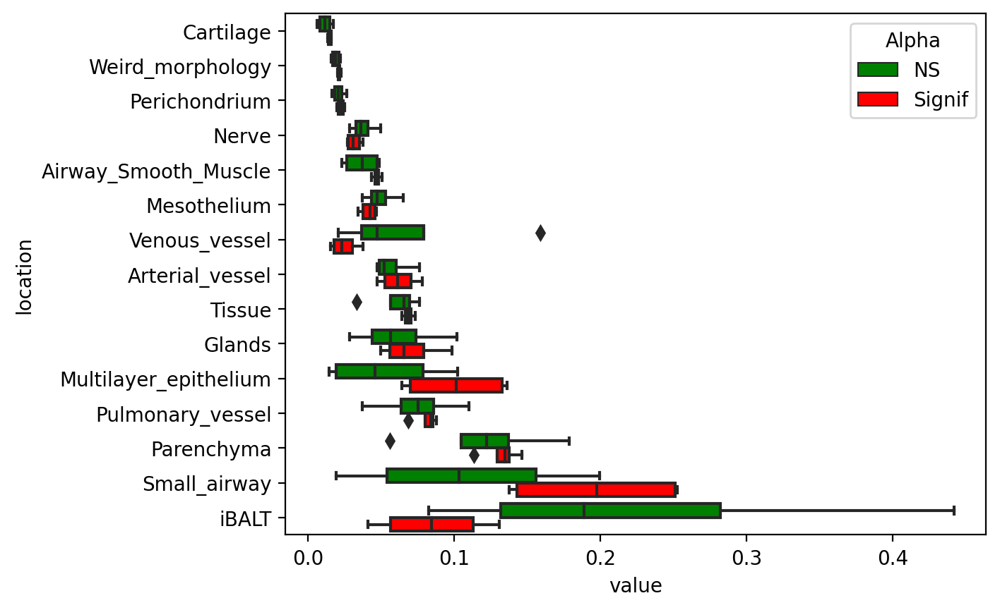

In [43]:
plt.rcParams.update(plt.rcParamsDefault)
bx = sns.boxplot(y='location',x='value',data=dd,hue='Alpha',palette = ["green", "red"],
                 orient= "h",saturation= 1, dodge= True, order= order )
#plt.setp(bx.get_xticklabels(), rotation=90)

## Analise B cells

In [44]:
Bcells_abundance = annot_abundance_norm

In [45]:
Bcells_abundance.index

Index(['AT1', 'AT2', 'B_memory', 'B_naive', 'B_plasma_IgA', 'B_plasma_IgG',
       'B_plasmablast', 'Basal', 'CD4_EM_Effector', 'CD4_TRM', 'CD4_naive_CM',
       'CD8_EM', 'CD8_EM_EMRA', 'CD8_TRM_EM', 'CD8_TRM', 'Chondrocyte',
       'Ciliated', 'DC_1', 'DC_2', 'DC_activated', 'DC_plasmacytoid',
       'Deuterosomal', 'Dividing_AT2', 'Dividing_Basal',
       'Endothelia_Lymphatic', 'Endothelia_vascular_Cap_a',
       'Endothelia_vascular_Cap_g', 'Endothelia_vascular_arterial_pulmonary',
       'Endothelia_vascular_arterial_systemic',
       'Endothelia_vascular_venous_pulmonary',
       'Endothelia_vascular_venous_systemic', 'Erythrocyte',
       'Fibro_adventitial', 'Fibro_alveolar', 'Fibro_immune_recruiting',
       'Fibro_myofibroblast', 'Fibro_peribronchial', 'Fibro_perichondrial',
       'ILC', 'Ionocyte_n_Brush', 'MAIT', 'Macro_CHIT1', 'Macro_interstitial',
       'Macro_AW_CX3CR1', 'Macro_alveolar_metallothioneins', 'Macro_alv',
       'Macro_dividing', 'Macro_int', 'Macro_CCL',

In [46]:
NOTsignif_CT = ['B_memory', 'B_plasma_IgA','B_plasmablast' ]
signif_CT = ['B_naive', 'B_plasma_IgG']

Bcells_abundance = Bcells_abundance.loc[[ 'B_memory', 'B_plasma_IgA','B_plasmablast',
                                         'B_naive', 'B_plasma_IgG']]

In [47]:
Bcells_abundance

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT,Alpha
B_memory,0.055662,0.020731,0.010776,0.041647,0.035238,0.028955,0.019538,0.043399,0.076283,0.048804,0.111863,0.056572,0.073382,0.073320,0.303829,NS
B_plasma_IgA,0.065197,0.114482,0.060144,0.541645,0.028551,0.041380,0.028187,0.012694,0.002995,0.006078,0.004611,0.005373,0.005199,0.024539,0.058924,NS
B_plasmablast,0.033668,0.040133,0.012928,0.147140,0.021678,0.021188,0.014533,0.043120,0.075891,0.028017,0.017658,0.056993,0.008913,0.013325,0.464815,NS
B_naive,0.061602,0.024146,0.015366,0.062002,0.082991,0.040722,0.022157,0.037448,0.042077,0.053433,0.113963,0.045194,0.072899,0.165326,0.160674,NS
B_plasma_IgG,0.030797,0.043989,0.016728,0.095733,0.015588,0.019642,0.014347,0.015105,0.013102,0.029374,0.022913,0.055771,0.013859,0.018618,0.594435,NS


In [48]:
Bcells_abundance.loc[signif_CT, "Alpha"] = "Signif"
Bcells_abundance.loc[NOTsignif_CT, "Alpha"] = "NS"
Bcells_abundance["Celltype"] = Bcells_abundance.index

In [49]:
dd=pd.melt(Bcells_abundance,id_vars=['Celltype', "Alpha"],
           var_name="location")
order = dd.groupby('location')['value'].mean().sort_values().index
dd

,Celltype,Alpha,location,value
0,B_memory,NS,Tissue,0.055662
1,B_plasma_IgA,NS,Tissue,0.065197
2,B_plasmablast,NS,Tissue,0.033668
3,B_naive,Signif,Tissue,0.061602
4,B_plasma_IgG,Signif,Tissue,0.030797
...,...,...,...,...
70,B_memory,NS,iBALT,0.303829
71,B_plasma_IgA,NS,iBALT,0.058924
72,B_plasmablast,NS,iBALT,0.464815
73,B_naive,Signif,iBALT,0.160674


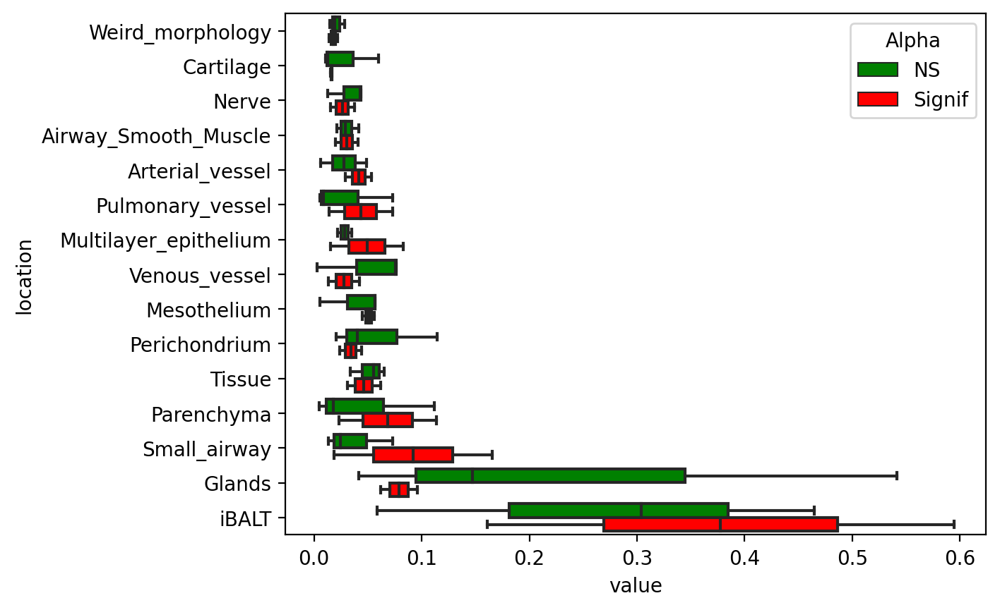

In [50]:
plt.rcParams.update(plt.rcParamsDefault)
bx = sns.boxplot(y='location',x='value',data=dd,hue='Alpha',palette = ["green", "red"],
                 orient= "h",saturation= 1, dodge= True, order= order )
#plt.setp(bx.get_xticklabels(), rotation=90)

In [51]:
Bcells_abundance

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT,Alpha,Celltype
B_memory,0.055662,0.020731,0.010776,0.041647,0.035238,0.028955,0.019538,0.043399,0.076283,0.048804,0.111863,0.056572,0.073382,0.073320,0.303829,NS,B_memory
B_plasma_IgA,0.065197,0.114482,0.060144,0.541645,0.028551,0.041380,0.028187,0.012694,0.002995,0.006078,0.004611,0.005373,0.005199,0.024539,0.058924,NS,B_plasma_IgA
B_plasmablast,0.033668,0.040133,0.012928,0.147140,0.021678,0.021188,0.014533,0.043120,0.075891,0.028017,0.017658,0.056993,0.008913,0.013325,0.464815,NS,B_plasmablast
B_naive,0.061602,0.024146,0.015366,0.062002,0.082991,0.040722,0.022157,0.037448,0.042077,0.053433,0.113963,0.045194,0.072899,0.165326,0.160674,Signif,B_naive
B_plasma_IgG,0.030797,0.043989,0.016728,0.095733,0.015588,0.019642,0.014347,0.015105,0.013102,0.029374,0.022913,0.055771,0.013859,0.018618,0.594435,Signif,B_plasma_IgG


## Analise Myeolid

In [52]:
Myeloid_abundance = annot_abundance_norm

In [53]:
Myeloid_abundance.index

Index(['AT1', 'AT2', 'B_memory', 'B_naive', 'B_plasma_IgA', 'B_plasma_IgG',
       'B_plasmablast', 'Basal', 'CD4_EM_Effector', 'CD4_TRM', 'CD4_naive_CM',
       'CD8_EM', 'CD8_EM_EMRA', 'CD8_TRM_EM', 'CD8_TRM', 'Chondrocyte',
       'Ciliated', 'DC_1', 'DC_2', 'DC_activated', 'DC_plasmacytoid',
       'Deuterosomal', 'Dividing_AT2', 'Dividing_Basal',
       'Endothelia_Lymphatic', 'Endothelia_vascular_Cap_a',
       'Endothelia_vascular_Cap_g', 'Endothelia_vascular_arterial_pulmonary',
       'Endothelia_vascular_arterial_systemic',
       'Endothelia_vascular_venous_pulmonary',
       'Endothelia_vascular_venous_systemic', 'Erythrocyte',
       'Fibro_adventitial', 'Fibro_alveolar', 'Fibro_immune_recruiting',
       'Fibro_myofibroblast', 'Fibro_peribronchial', 'Fibro_perichondrial',
       'ILC', 'Ionocyte_n_Brush', 'MAIT', 'Macro_CHIT1', 'Macro_interstitial',
       'Macro_AW_CX3CR1', 'Macro_alveolar_metallothioneins', 'Macro_alv',
       'Macro_dividing', 'Macro_int', 'Macro_CCL',

In [54]:
NOTsignif_CT = ['Macro_CHIT1', 'Macro_interstitial',
                'DC_1', 'DC_plasmacytoid',
                'Macro_alveolar_metallothioneins', 'Macro_alv',
                'Macro_dividing', 'Macro_int', 'Macro_CCL',
                'Megakaryocyte', 'Macrophage_intermediate',
                'Monocyte_CD14', 'Monocyte_CD16']
signif_CT = ['Macro_AW_CX3CR1', 'DC_2', 'DC_activated' ]

Myeloid_abundance = Myeloid_abundance.loc[[ 'Macro_CHIT1', 'Macro_interstitial',
                                         'DC_1', 'DC_plasmacytoid',
                                         'Macro_alveolar_metallothioneins', 'Macro_alv',
                                         'Macro_dividing', 'Macro_int', 'Macro_CCL',
                                         'Megakaryocyte', 'Macrophage_intermediate',
                                         'Monocyte_CD14', 'Monocyte_CD16',
                                         'Macro_AW_CX3CR1', 'DC_2', 'DC_activated'
                                        ]]

In [55]:
Myeloid_abundance

,Tissue,Perichondrium,Cartilage,Glands,Multilayer_epithelium,Airway_Smooth_Muscle,Weird_morphology,Nerve,Venous_vessel,Arterial_vessel,Parenchyma,Mesothelium,Pulmonary_vessel,Small_airway,iBALT,Alpha
Macro_CHIT1,0.082359,0.017680,0.005078,0.047947,0.007473,0.010507,0.010556,0.034077,0.068962,0.027024,0.203358,0.097618,0.094598,0.039860,0.252902,NS
Macro_interstitial,0.089183,0.013951,0.005211,0.037676,0.023780,0.011584,0.011649,0.025106,0.047912,0.019628,0.225125,0.077717,0.117930,0.082717,0.210833,NS
DC_1,0.052399,0.018026,0.007808,0.050204,0.057624,0.021818,0.012965,0.078434,0.089248,0.030060,0.104032,0.045838,0.060593,0.121028,0.249925,NS
DC_plasmacytoid,0.061319,0.023925,0.015144,0.071921,0.100913,0.050634,0.022347,0.045341,0.028757,0.067234,0.107561,0.039165,0.067133,0.184196,0.114411,NS
Macro_alveolar_metallothioneins,0.039372,0.024065,0.008242,0.076252,0.013029,0.031796,0.016505,0.049776,0.108510,0.090738,0.062162,0.050807,0.035580,0.022382,0.370784,NS
Macro_alv,0.124676,0.005282,0.002275,0.016811,0.004848,0.010325,0.011289,0.023717,0.016936,0.027977,0.343139,0.095306,0.176238,0.079015,0.062164,NS
Macro_dividing,0.107012,0.008285,0.003612,0.027201,0.009783,0.018800,0.012548,0.046540,0.027583,0.044429,0.284738,0.082646,0.145769,0.070358,0.110694,NS
Macro_int,0.043205,0.021949,0.005965,0.051480,0.008045,0.010183,0.011860,0.040547,0.111285,0.025258,0.082448,0.072258,0.047130,0.019837,0.448548,NS
Macro_CCL,0.083462,0.017003,0.009371,0.057543,0.026330,0.017429,0.016845,0.035177,0.050380,0.028405,0.198974,0.071051,0.107572,0.088187,0.192271,NS
Megakaryocyte,0.055715,0.029994,0.021292,0.114635,0.132891,0.093833,0.031114,0.045881,0.021136,0.118657,0.066517,0.018950,0.041572,0.184115,0.023697,NS


In [56]:
Myeloid_abundance.loc[signif_CT, "Alpha"] = "Signif"
Myeloid_abundance.loc[NOTsignif_CT, "Alpha"] = "NS"
Myeloid_abundance["Celltype"] = Myeloid_abundance.index

In [57]:
dd=pd.melt(Myeloid_abundance,id_vars=['Celltype', "Alpha"],
           var_name="location")
order = dd.groupby('location')['value'].mean().sort_values().index
dd

,Celltype,Alpha,location,value
0,Macro_CHIT1,NS,Tissue,0.082359
1,Macro_interstitial,NS,Tissue,0.089183
2,DC_1,NS,Tissue,0.052399
3,DC_plasmacytoid,NS,Tissue,0.061319
4,Macro_alveolar_metallothioneins,NS,Tissue,0.039372
...,...,...,...,...
235,Monocyte_CD14,NS,iBALT,0.322261
236,Monocyte_CD16,NS,iBALT,0.340276
237,Macro_AW_CX3CR1,Signif,iBALT,0.193707
238,DC_2,Signif,iBALT,0.135507


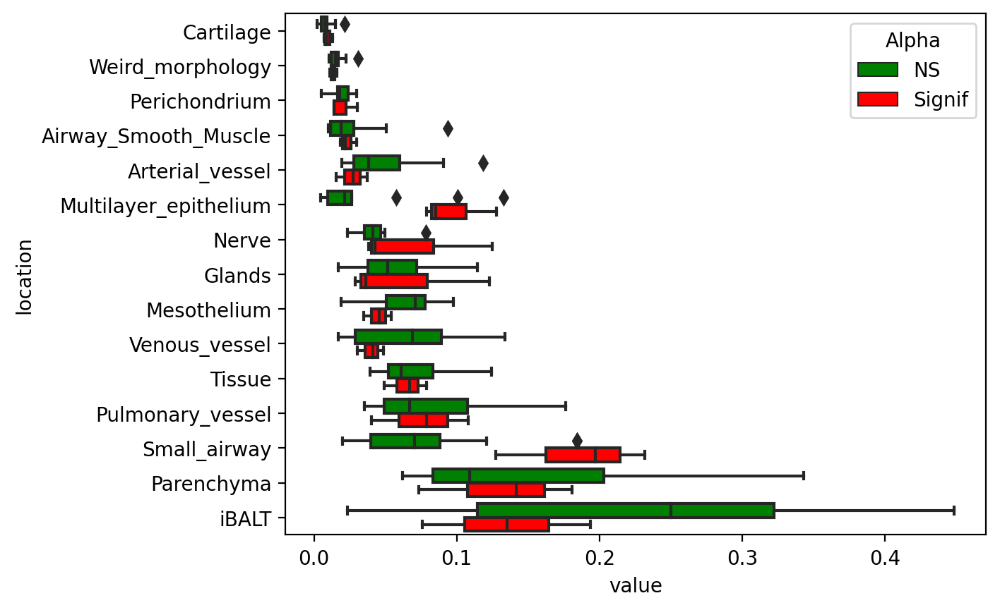

In [58]:
plt.rcParams.update(plt.rcParamsDefault)
bx = sns.boxplot(y='location',x='value',data=dd,hue='Alpha',palette = ["green", "red"],
                 orient= "h",saturation= 1, dodge= True, order= order )
#plt.setp(bx.get_xticklabels(), rotation=90)

## Export to csv to test in R

In [ ]:
Bcells_meted =pd.melt(Bcells_abundance,id_vars=['Celltype', "Alpha"],
                      var_name="location")

Bcells_abundance.to_csv("./spatial/Bcell_abundance.csv")
Bcells_meted.to_csv("./spatial/Bcell_melted.csv")

In [ ]:
Tcells_meted =pd.melt(Tcells_abundance,id_vars=['Celltype', "Alpha"],
                      var_name="location")

Tcells_abundance.to_csv("./spatial/Tcell_abundance.csv")
Tcells_meted.to_csv("./spatial/Tcell_melted.csv")

In [ ]:
Myeloid_meted =pd.melt(Myeloid_abundance,id_vars=['Celltype', "Alpha"],
                      var_name="location")

Myeloid_abundance.to_csv("./spatial/Myeloid_abundance.csv")
Myeloid_meted.to_csv("./spatial/Myeloid_melted.csv")

In [ ]:
#from scipy import stats

In [ ]:
#tissue = "iBALT"

In [ ]:
#t = dd[dd["location"] == tissue]
#x = t[t["Alpha"] == "Signif"]["value"]
#y = t[t["Alpha"] == "NS"]["value"]
#t_stat, p_value = stats.ttest_ind(x, y)

In [ ]:
#p_value